In [1]:
# !pip install -q voyagerpy==0.1.1 gget==0.28.4 watermark==2.4.3 scanpy==1.10.1

In [2]:
import voyagerpy as vp
import numpy as np
import pandas as pd
import matplotlib
from matplotlib import pyplot as plt
import pathlib
import scanpy as sc
import os
import requests

import gget

plt.rcParams['axes.grid'] = False
plt.rcParams['axes.edgecolor'] = 'none'  # Hides the axes border
# plt.rcParams['xtick.color'] = 'none'  # Hides x-axis ticks
# plt.rcParams['ytick.color'] = 'none'  # Hides y-axis ticks

plt.rcParams['figure.dpi'] = 120

# Turn on matplotlib interactive mode so we don't need to explicitly call plt.show()
_ = plt.ion()

In [3]:
root_dir = pathlib.Path(os.getcwd())
outs_dir = pathlib.Path(f'{root_dir}/outs')

outs_dir.mkdir(parents=True, exist_ok=True)

def download_data(tar_path, url_reads, outs_dir = outs_dir):
    if not tar_path.exists():
        res = requests.get(url_reads)
        with tar_path.open('wb') as f:
            f.write(res.content)

        !tar -xvf $tar_path -C $outs_dir

In [4]:
# Download the gene count matrix
tar_path = root_dir / 'visium_ob.tar.gz'
url_reads = "https://cf.10xgenomics.com/samples/spatial-exp/2.0.0/Visium_Mouse_Olfactory_Bulb/Visium_Mouse_Olfactory_Bulb_raw_feature_bc_matrix.tar.gz"
download_data(tar_path, url_reads)

# This is the spatial information
tar_path_spatial = root_dir / 'visium_ob_spatial.tar.gz'
url_reads_spatial = "https://cf.10xgenomics.com/samples/spatial-exp/2.0.0/Visium_Mouse_Olfactory_Bulb/Visium_Mouse_Olfactory_Bulb_spatial.tar.gz"
download_data(tar_path_spatial, url_reads_spatial)

Here we read the data into Python as an Anndata object

In [5]:
adata_image_res = 'hires'

adata = vp.read_10x_visium(
    outs_dir,
    datatype = 'mtx',
    raw = True,
    prefix = None,
    symbol_as_index=False,
    dtype=np.float64,
    res=adata_image_res
)

/Users/joeyrich/miniconda3/envs/seurat_vs_scanpy/lib/python3.9/site-packages/anndata/_core/anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


Here we add QC metrics, already plotted in the introductory vignette.

In [6]:
is_mt = adata.var['symbol'].str.contains('^mt-').values
vp.utils.add_per_cell_qcmetrics(adata, subsets={'mito': is_mt})

In [7]:
visium_spots = vp.spatial.get_visium_spots(adata, with_radius=True)

_ = vp.spatial.set_geometry(adata, geom="spot_poly", values=visium_spots)

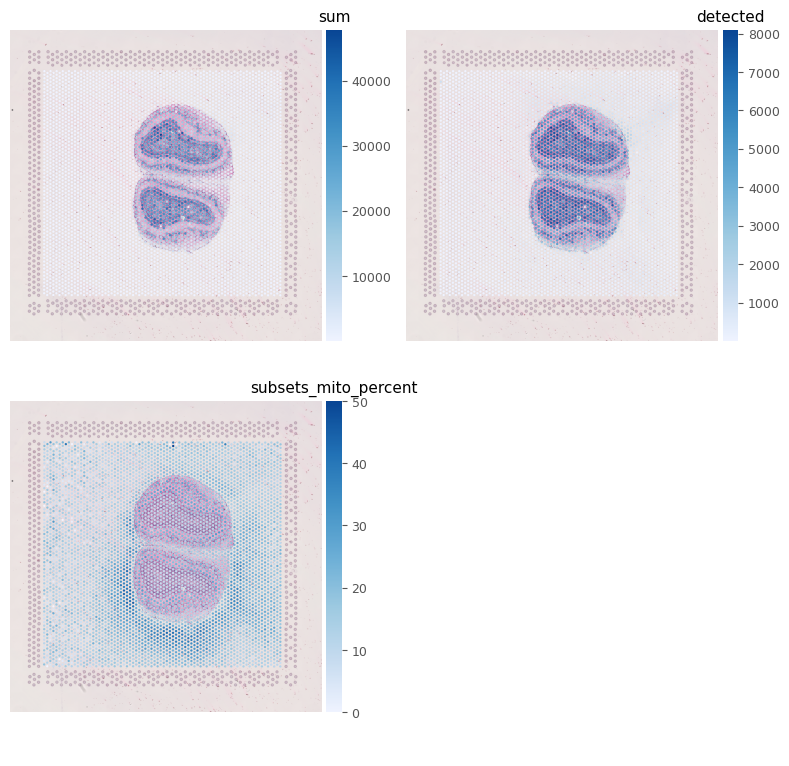

In [8]:
qc_features = ["sum", "detected", "subsets_mito_percent"]
axs = vp.plt.plot_spatial_feature(
    adata,
    qc_features,
    image_kwargs=dict(),
    subplot_kwargs=dict(figsize=(8,8), dpi=100, layout='tight')
)

## Tissue segmentation

While Space Ranger can automatically detect which spots are in tissue and the Loupe browser can be used to manually annotate which spots are in tissue, it may be interesting to get the tissue outline polygon, so we would know how much each spot overlaps with the tissue and plot the outline. The tissue boundary polygon can be manually annotated with QuPath, which saves the polygon as a GeoJSON and can be directly read into R with st_read().

Or we can segment the tissue computationally. R generally isn’t great for image processing, but there are some packages that can perform the segmentation, such as EBImage, which is based on its own in house C and C++ code, and imager, which is based on CImg.

Here we don’t have the full resolution image. We will perform tissue segmentation on the high resolution downsampled image and then scale it to make the coordinates of the tissue boundary match those of the spots. The EBImage package is used here. Compared to OpenCV, EBImage is slow on the full resolution image, but should be fine here for the downsized image.

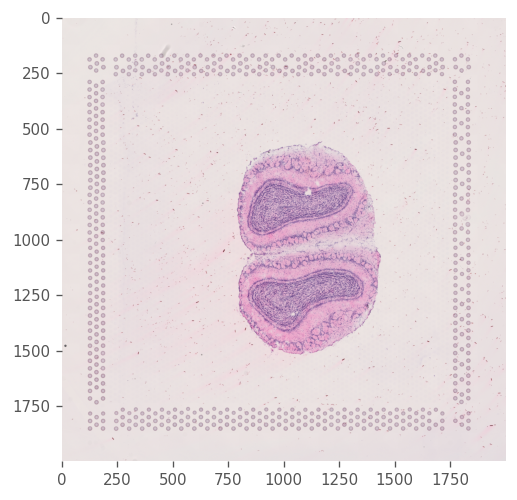

In [9]:
image_path = 'outs/spatial/tissue_hires_image.png'
im = plt.imread(image_path)
_ = plt.imshow(im, origin = 'upper')

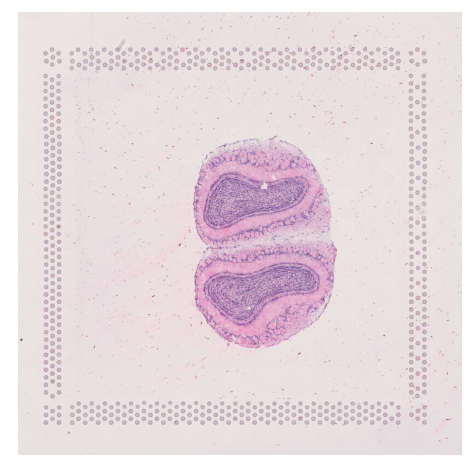

In [10]:
_ = vp.plt.imshow(adata, origin = 'upper')

The array of dots framing the tissue seen in this image is the fiducials, used to align the tissue image to the positions of the Visium spots, so gene expression can be matched to spatial locations. The alignment of the fiducials is shown in `aligned_fiducials.jpg`. Space Ranger can automatically detect which spots are in tissue, and these spots are highlighted in `detected_tissue_image.jpg`.

Inside the `scalefactors_json.json` file:

In [11]:
import json
json_path = outs_dir / 'spatial' / 'scalefactors_json.json'

with json_path.open() as file:
    print(json.load(file))

{'tissue_hires_scalef': 0.2, 'tissue_lowres_scalef': 0.06, 'fiducial_diameter_fullres': 118.91545, 'spot_diameter_fullres': 73.61433}


Here we show the RGB channels separately

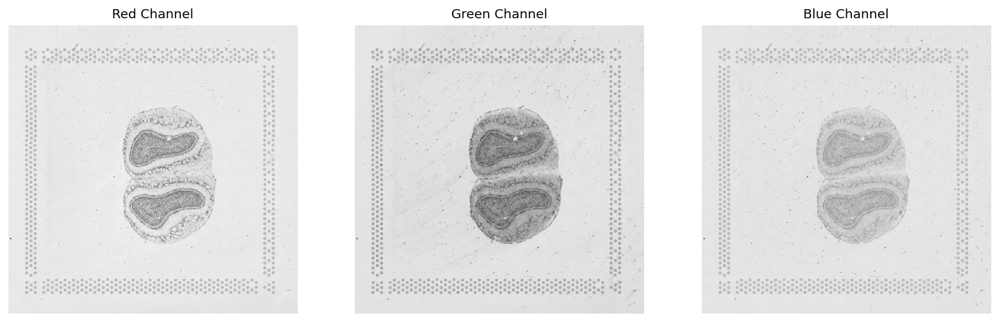

In [12]:
image_path = 'outs/spatial/tissue_hires_image.png'
im = plt.imread(image_path)

# Split the image into RGB components
r = im[:, :, 0]
g = im[:, :, 1]
b = im[:, :, 2]

r = np.flipud(r)
g = np.flipud(g)
b = np.flipud(b)

# Create a figure with 3 subplots side by side
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Display each channel
axs[0].imshow(r, cmap='gray', origin='lower')
axs[0].set_title('Red Channel')
axs[0].axis('off')  # Hide axes

axs[1].imshow(g, cmap='gray', origin='lower')
axs[1].set_title('Green Channel')
axs[1].axis('off')  # Hide axes

axs[2].imshow(b, cmap='gray', origin='lower')
axs[2].set_title('Blue Channel')
axs[2].axis('off')  # Hide axes

plt.show()

An alternative way to have an interactive image

In [13]:
# from PIL import Image
# from IPython.display import display

# # Load the image
# image_path = 'outs/spatial/tissue_hires_image.png'
# img_interactive = Image.open(image_path)

# # Display the image
# display(img_interactive)

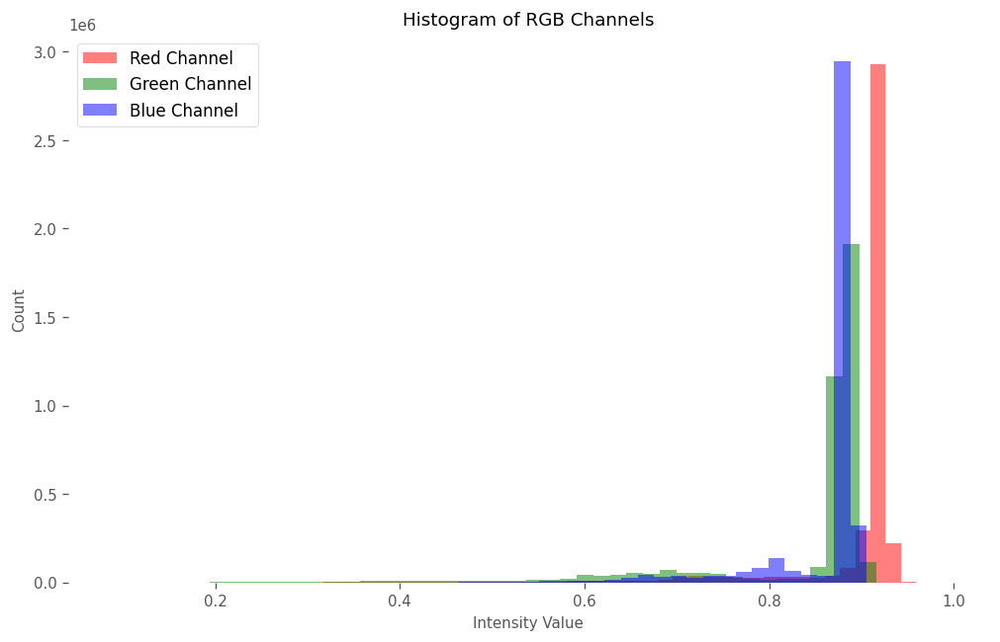

In [14]:
r = im[:, :, 0].flatten()  # Flatten to 1D array for histogram
g = im[:, :, 1].flatten()  # Flatten to 1D array for histogram
b = im[:, :, 2].flatten()  # Flatten to 1D array for histogram

bins = 50  # Adjust this value based on your specific image data range

# Create histograms
plt.figure(figsize=(10, 6))
plt.hist(r, bins=bins, color='red', alpha=0.5, label='Red Channel')
plt.hist(g, bins=bins, color='green', alpha=0.5, label='Green Channel')
plt.hist(b, bins=bins, color='blue', alpha=0.5, label='Blue Channel')

# Add labels and title
plt.xlabel('Intensity Value')
plt.ylabel('Count')
plt.title('Histogram of RGB Channels')
plt.legend()

# Show the plot
plt.show()

The tissue can be discerned with thresholding. The tall peak on the right is the background. The much lower peaks from around 0.6 to 0.85 must be the tissue. To capture the faint bluish region, the blue channel is used for thresholding. The threshold here is chosen based on the histogram and experimenting with nearby values.

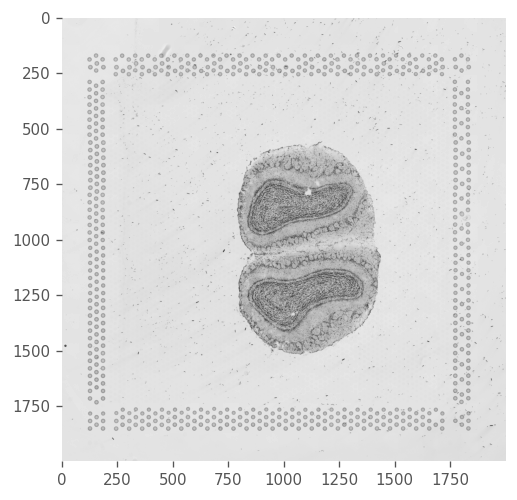

In [15]:
# img2 = 0.2989 * im[:, :, 0] + 0.5870 * im[:, :, 1] + 0.1140 * im[:, :, 2]
from skimage import io, color, morphology, util
img2 = color.rgb2gray(im)
_ = plt.imshow(img2, origin = 'upper', cmap = 'gray')

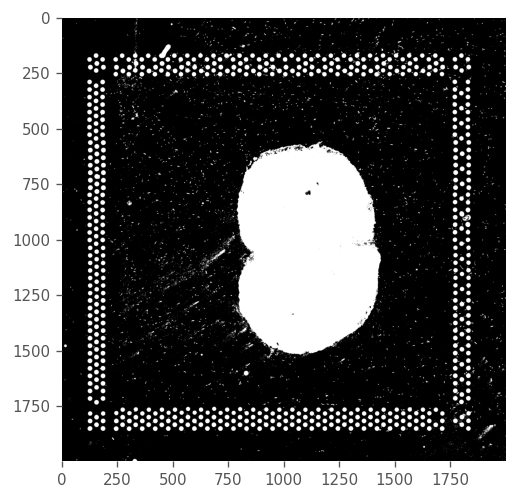

In [16]:
mask = im[:,:,2] < 0.87
_ = plt.imshow(mask, origin='upper', cmap = 'gray')

Then we use an opening operation (erosion followed by dilation) to denoise

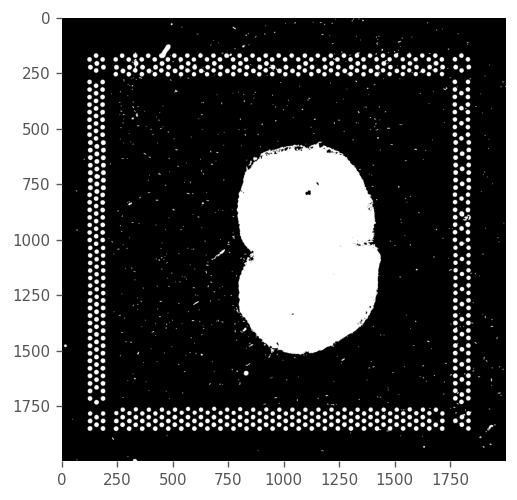

In [17]:
from scipy.ndimage import binary_opening, binary_closing

kern = np.ones((3, 3), dtype=np.uint8)

mask_open = binary_opening(mask, structure=kern)

_ = plt.imshow(mask_open, origin='upper', cmap = 'gray')

There are some small holes in the tissue, which can be removed by a closing operation (dilation followed by erosion):

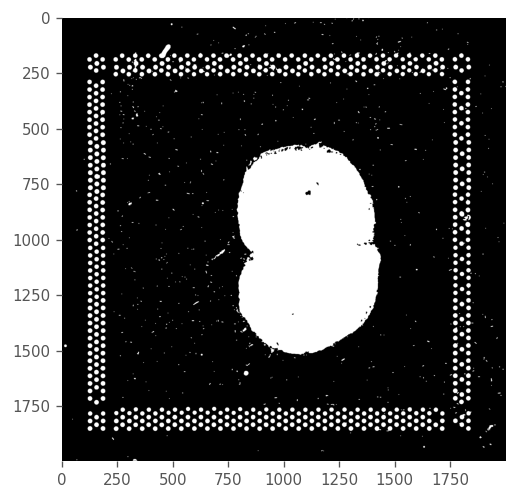

In [18]:
mask_close = binary_closing(mask_open, kern)
_ = plt.imshow(mask_close, origin='upper', cmap = 'gray')

There are some larger holes in the tissue mask, which may be real holes or faint regions with few nuclei missed by thresholding. They might not be large enough to affect which Visium spots intersect the tissue.

Now the main piece of tissue is clear. It must be the object with the largest area. However, there are two small pieces that should belong to the tissue at the top left. The debris and fiducials can be removed by setting all pixels in the mask outside the bounding box of the main piece to 0. Here we assign a different value to each contiguous object with bwlabel(), and use computeFeatures.shape() to find the area among other shape features (e.g. perimeter) of each object.

In [19]:
from skimage.measure import label, regionprops, regionprops_table

mask_label = label(mask_close, connectivity=2)
properties = regionprops(mask_label)

def radii_from_centroid(region):
    centroid = np.array(region.centroid)
    coords = np.array(region.coords)
    distances = np.linalg.norm(coords - centroid, axis=1)
    return distances

# Print area and perimeter for each region
for prop in properties[:6]:
    radii = radii_from_centroid(prop)

    print(f"Label: {prop.label}, Area: {prop.area}, Perimeter: {prop.perimeter}, Radius mean: {np.mean(radii)}, Radius std: {np.std(radii)}, Radius min: {np.min(radii)}, Radius max: {np.max(radii)}")

Label: 1, Area: 25.0, Perimeter: 17.621320343559642, Radius mean: 2.1943061647255764, Radius std: 1.018734732620485, Radius min: 0.16492422502469775, Radius max: 4.20323684795417
Label: 2, Area: 15.0, Perimeter: 12.0, Radius mean: 1.5067417439661026, Radius std: 0.6295998599560315, Radius min: 0.0, Radius max: 2.23606797749979
Label: 3, Area: 14.0, Perimeter: 10.82842712474619, Radius mean: 1.4085841751813566, Radius std: 0.4797669597985792, Radius min: 0.7071067811865476, Radius max: 2.1213203435596424
Label: 4, Area: 15.0, Perimeter: 12.0, Radius mean: 1.5067417439661026, Radius std: 0.6295998599560315, Radius min: 0.0, Radius max: 2.23606797749979
Label: 5, Area: 9.0, Perimeter: 8.0, Radius mean: 1.0729838054991534, Radius std: 0.4266603877440328, Radius min: 0.0, Radius max: 1.4142135623730951
Label: 6, Area: 9.0, Perimeter: 8.0, Radius mean: 1.0729838054991534, Radius std: 0.4266603877440328, Radius min: 0.0, Radius max: 1.4142135623730951


In [20]:
max_area = 0
max_label = None
for prop in properties:
    if prop.area > max_area:
        max_area = prop.area
        max_label = prop.label

if max_label is not None:
    inds = np.argwhere(mask_label == max_label)
    # Print the first few coordinates
    print("Coordinates of the region with the max area:")
    print(inds[:6])  # prints first 6 coordinates
else:
    print("No regions found or something went wrong.")

Coordinates of the region with the max area:
[[ 561 1167]
 [ 561 1168]
 [ 561 1169]
 [ 562 1157]
 [ 562 1158]
 [ 562 1159]]


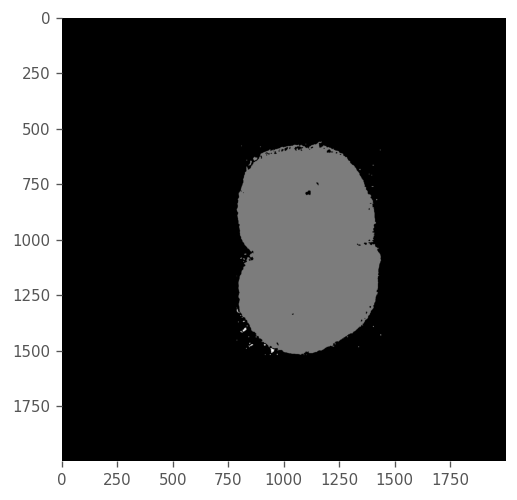

In [21]:
region = next((prop for prop in properties if prop.label == max_label), None)

if region is not None:
    # Extract the bounding box of the region with the max area
    minr, minc, maxr, maxc = region.bbox

    # Compute indices to zero out
    # Rows outside the bounding box
    row_inds = np.concatenate((np.arange(minr), np.arange(maxr + 1, mask_label.shape[0])))
    # Columns outside the bounding box
    col_inds = np.concatenate((np.arange(minc), np.arange(maxc + 1, mask_label.shape[1])))

    # Set these regions in the mask to zero
    mask_label[row_inds, :] = 0
    mask_label[:, col_inds] = 0
else:
    print("Region not found.")

_ = plt.imshow(mask_label, origin='upper', cmap = 'gray')

Then remove the small pieces that are debris.

In [22]:
np.unique(mask_label)

array([  0, 419, 423, 427, 428, 436, 448, 456, 459, 467, 471, 481, 485,
       503, 521, 631, 638, 640, 649, 674, 735, 737, 753, 758, 771, 774,
       785, 787, 793, 801, 807, 814, 815, 816, 820, 825, 831, 832, 833,
       836, 838, 841, 842, 854, 855, 856, 858, 859], dtype=int32)

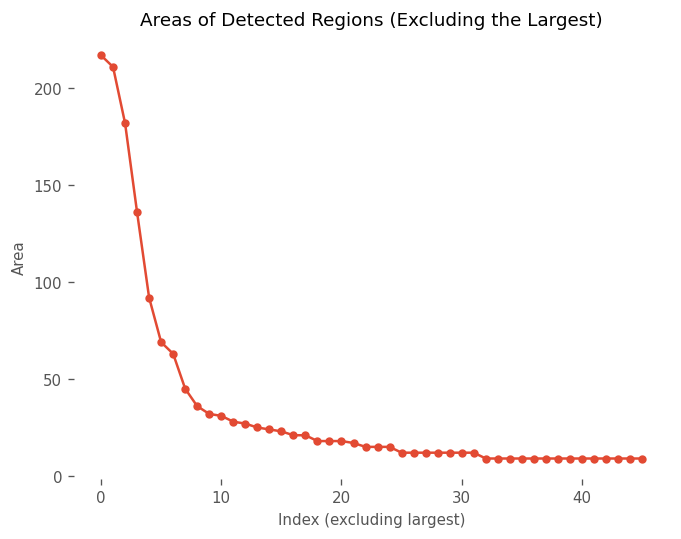

In [23]:
unique_labels = np.unique(mask_label)[1:]
filtered_props = [prop for prop in properties if prop.label in unique_labels]

# Create a DataFrame from the filtered properties
data = {
    'label': [prop.label for prop in filtered_props],
    'area': [prop.area for prop in filtered_props],
    'perimeter': [prop.perimeter for prop in filtered_props],
    'radius_mean': [np.mean(radii_from_centroid(prop)) for prop in filtered_props],
    'radius_std': [np.std(radii_from_centroid(prop)) for prop in filtered_props],
    'radius_min': [np.min(radii_from_centroid(prop)) for prop in filtered_props],
    'radius_max': [np.max(radii_from_centroid(prop)) for prop in filtered_props]
    # Add more features as needed
}

df = pd.DataFrame(data)

# Sort by area
df_sorted = df.sort_values(by='area', ascending=False)

# Plot excluding the largest
plt.plot(df_sorted['area'].iloc[1:].values, marker='o')  # Line plot with points
plt.xlabel('Index (excluding largest)')
plt.ylabel('Area')
plt.title('Areas of Detected Regions (Excluding the Largest)')
plt.show()

In [24]:
df_sorted[:10]

,label,area,perimeter,radius_mean,radius_std,radius_min,radius_max
0,419,496326.0,4749.422761,274.864682,105.393104,0.300297,488.487726
5,448,217.0,61.213203,5.730327,2.194133,0.433400,10.768995
41,842,211.0,70.041631,6.018395,2.594939,0.347914,12.110185
27,793,182.0,60.970563,5.825198,2.608024,0.083870,12.124193
7,459,136.0,60.627417,6.296327,3.125645,0.483396,13.245360
20,737,92.0,61.213203,5.600576,2.812181,0.864250,12.208656
37,833,69.0,35.899495,3.779884,1.742574,0.597552,7.157278
43,855,63.0,41.142136,4.639924,2.341999,0.311855,9.153130
36,832,45.0,26.242641,2.651259,1.037547,0.223331,4.387468
28,801,36.0,25.414214,3.034828,1.311042,0.590564,5.726536


Object number 793 is a piece of debris at the bottom left. The other pieces with area over 100 pixels are tissue. Since debris really is small bits of tissue, so the boundary between debris and tissue can be blurry. Here the two are distinguished by morphology on the H&E image and proximity to the main tissue.

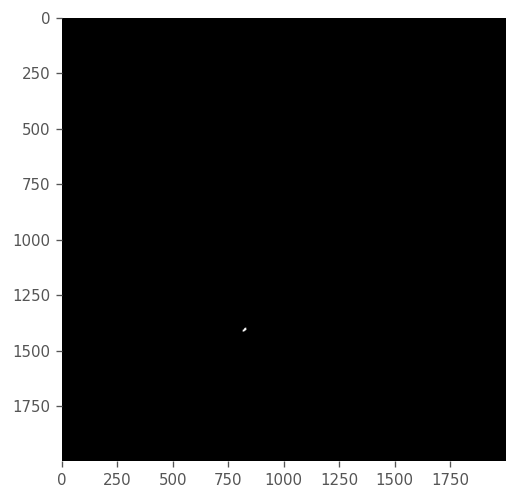

In [25]:
_ = plt.imshow(mask_label == 793, origin='upper', cmap = 'gray')

Here we remove the debris from the mask

In [26]:
mask_label[mask_label == 793] = 0

for unique_label in unique_labels:
    if int(df_sorted['area'][df_sorted['label'] == unique_label]) < 100:
        mask_label[mask_label == unique_label] = 0

Since most holes in the mask are faint regions of the tissue missed by thresholding, the holes will be filled

In [27]:
from scipy.ndimage import binary_fill_holes

mask_label = binary_fill_holes(mask_label)

In [28]:
from skimage import io, color, morphology, util
from matplotlib.colors import ListedColormap

# Create outlines by subtracting eroded version from the mask
eroded = morphology.erosion(mask_label)
#!!! outlines = mask_label - eroded
outlines = np.logical_xor(mask_label, eroded)

# Create an RGBA image based on the grayscale image
rgba_img = color.gray2rgba(img2)

# Color map: Modify this part as per the number of labels and required colors
colors = {
    1: (1, 1, 0, 0.3),  # Yellow fill with 30% opacity
    2: (1, 0, 0, 1)     # Red for outlines with full opacity
}

# Apply colors: fill and outlines
for label, color_value in colors.items():
    if label == 1:
        mask = mask_label > 0
        rgba_img[mask] = rgba_img[mask] * (1 - color_value[3]) + np.array(color_value[:3] + (0,)) * color_value[3]
    elif label == 2:
        rgba_img[outlines > 0] = color_value


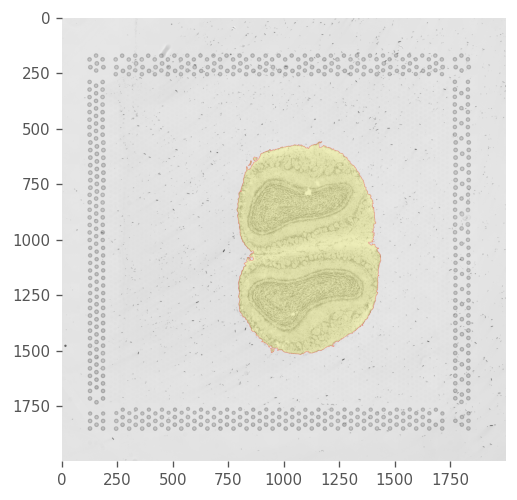

In [29]:
_ = plt.imshow(rgba_img, origin = 'upper')

This segmentation process took a lot of manual oversight, in choosing the threshold, choosing kernel size and shape in the opening and closing operations, deciding whether to fill the holes, and deciding what is debris and what is tissue.

# Convert tissue mask to polygon

Now we have the tissue mask, which we will convert to polygon. While OpenCV can directly perform the conversion, as there isn't a comprehensive R wrapper of OpenCV, this conversion is more convoluted in R. We first convert the Image object to a raster as implemented in terra, the core R package for geospatial raster data. Then terra can convert the raster to polygon. As this image is downsized, the polygon will look quite pixelated. To mitigate this pixelation and save memory, the ms_simplify() function is used to simplify the polygon, only keeping a small proportion of all vertices. The st_simplify() function in sf can also simplify the polygons, but we can't specify what proportion of vertices to keep.

In [30]:
mask_label_binary = mask_label
mask_label_binary[mask_label_binary != 0] = 255
mask_label_binary = mask_label_binary.astype(np.uint8)

In [31]:
np.unique(mask_label_binary)

array([0, 1], dtype=uint8)

In [32]:
adata.uns["spatial"]["geom"] = {}
adata.uns["spatial"]["geom"]["tissueBoundary_hires"] = vp.spatial.get_tissue_boundary(adata, size = adata_image_res)

In [33]:
from shapely.affinity import scale

with json_path.open() as file:
    data = json.load(file)
    lowres_boundary_scale_factor = data['tissue_lowres_scalef']
    hires_boundary_scale_factor = data['tissue_hires_scalef']
    spot_scale_factor = data['spot_diameter_fullres']

adata.uns["spatial"]["geom"]["tissueBoundary"] = scale(adata.uns["spatial"]["geom"]["tissueBoundary_hires"], xfact=1/hires_boundary_scale_factor, yfact = 1/hires_boundary_scale_factor, origin = (0,0))
adata.uns["spatial"]["geom"]["tissueBoundary_lowres"] = scale(adata.uns["spatial"]["geom"]["tissueBoundary"], xfact=lowres_boundary_scale_factor, yfact = lowres_boundary_scale_factor, origin = (0,0))
adata.uns["spatial"]["geom"]["tissueBoundary_hires_exterior"] = adata.uns["spatial"]["geom"]["tissueBoundary_hires"].exterior

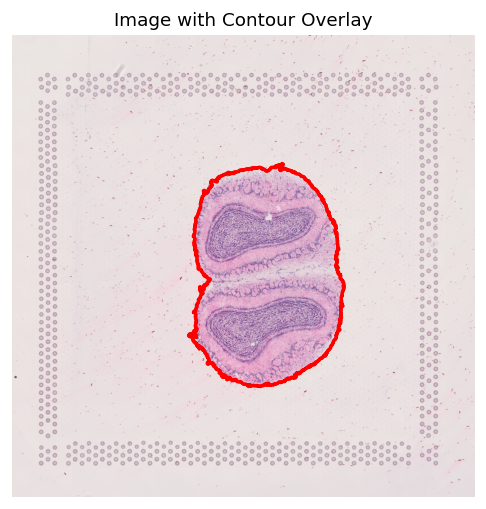

In [34]:
plt.figure(figsize=(10, 5))
plt.imshow(im, origin = 'upper')  # Show the image
plt.title('Image with Contour Overlay')
plt.axis('off')  # Hide axes

x, y = adata.uns["spatial"]["geom"]["tissueBoundary_hires"].exterior.xy
plt.plot(x, y, color="red", linewidth=2)  # Plot the polygon with a specified color and line width

plt.show()

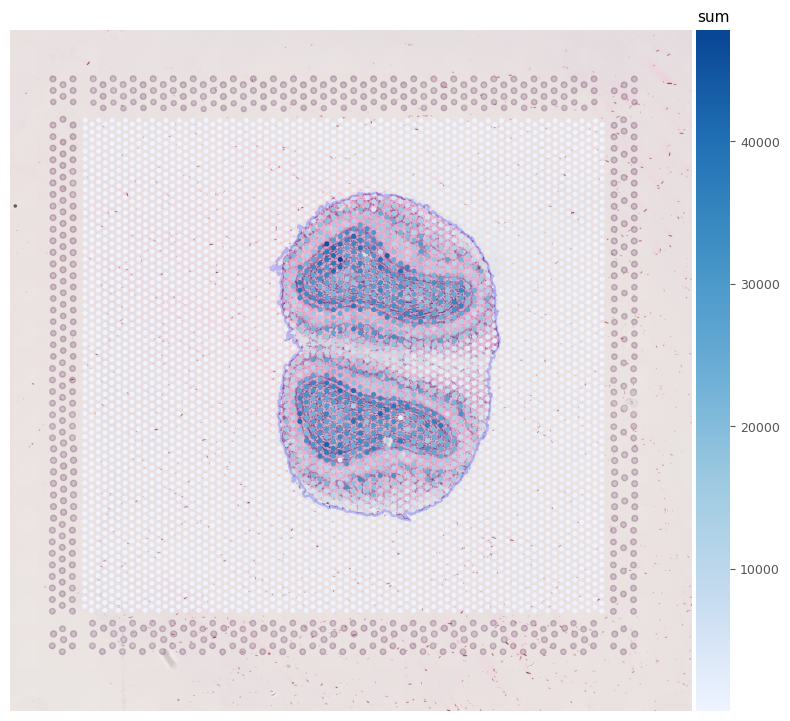

In [35]:
axs = vp.plt.plot_spatial_feature(
    adata,
    "sum",
    image_kwargs=dict(),
    annot_geom = 'tissueBoundary_hires_exterior',
    subplot_kwargs=dict(figsize=(8,8), dpi=100, layout='tight')
)

The mouse olfactory bulb is conventionally plotted horizontally. The entire SFE object can be transposed in histologial space to make the olfactory bulb horizontal.

In [36]:
adata.uns["spatial"]["img"][adata_image_res] = np.swapaxes(adata.uns["spatial"]["img"][adata_image_res], 0, 1)

adata.uns["spatial"]["geom"]["tissueBoundary_hires"] = vp.spatial.get_tissue_boundary(adata, size = adata_image_res)
adata.uns["spatial"]["geom"]["tissueBoundary"] = scale(adata.uns["spatial"]["geom"]["tissueBoundary_hires"], xfact=1/hires_boundary_scale_factor, yfact = 1/hires_boundary_scale_factor, origin = (0,0))
adata.uns["spatial"]["geom"]["tissueBoundary_lowres"] = scale(adata.uns["spatial"]["geom"]["tissueBoundary"], xfact=lowres_boundary_scale_factor, yfact = lowres_boundary_scale_factor, origin = (0,0))
adata.uns["spatial"]["geom"]["tissueBoundary_hires_exterior"] = adata.uns["spatial"]["geom"]["tissueBoundary_hires"].exterior

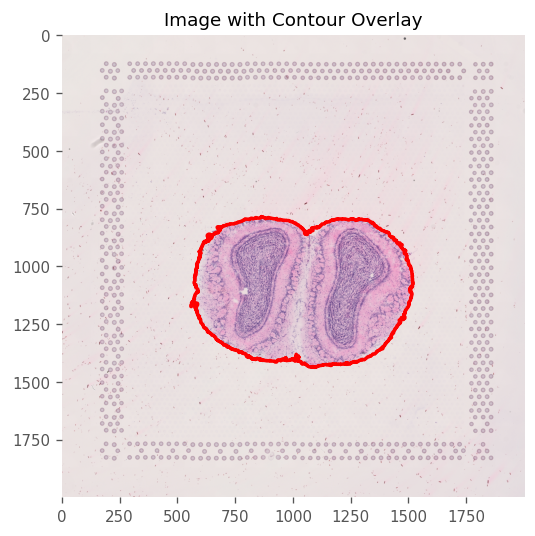

In [37]:
transposed_im = np.transpose(im, (1, 0, 2))
transposed_mask_label_binary = np.transpose(mask_label_binary)

plt.figure(figsize=(10, 5))
plt.imshow(transposed_im, origin = 'upper')  # Show the image
plt.title('Image with Contour Overlay')
# plt.axis('off')  # Hide axes

x, y = adata.uns["spatial"]["geom"]["tissueBoundary_hires"].exterior.xy
plt.plot(x, y, color="red", linewidth=2)  # Plot the polygon with a specified color and line width

plt.show()

In [38]:
spatial_coords_df = adata.obs[['pxl_row_in_fullres', 'pxl_col_in_fullres']]
spatial_coords_df

,pxl_row_in_fullres,pxl_col_in_fullres
AAACAACGAATAGTTC-1,7762,1101
AAACAAGTATCTCCCA-1,2887,6022
AAACAATCTACTAGCA-1,6232,1395
AAACACCAATAACTGC-1,7586,6914
AAACAGAGCGACTCCT-1,3343,2476
...,...,...
TTGTTTCACATCCAGG-1,6283,6814
TTGTTTCATTAGTCTA-1,6963,7012
TTGTTTCCATACAACT-1,7134,5534
TTGTTTGTATTACACG-1,6338,8292


In [39]:
from shapely.geometry import Polygon, Point
from shapely.predicates import contains
width_of_original_im = im.shape[0] / hires_boundary_scale_factor
height_of_original_im = im.shape[1] / hires_boundary_scale_factor

adata.obs['pxl_col_in_fullres_transposed'] = adata.obs.apply(
    lambda row: row['pxl_row_in_fullres'],
    axis=1
)
adata.obs['pxl_row_in_fullres_transposed'] = adata.obs.apply(
    lambda row: row['pxl_col_in_fullres'],
    axis=1
)

def check_intersection(row):
    # Create a circle at the given coordinates with the specified radius
    circle = Point(row['pxl_col_in_fullres_transposed'], row['pxl_row_in_fullres_transposed']).buffer(0.5*spot_scale_factor)

    # Check if the circle intersects any polygon
    found_intersection = circle.intersects(adata.uns["spatial"]["geom"]["tissueBoundary"])

    return found_intersection

def check_contain(row):
    # Create a circle at the given coordinates with the specified radius
    circle = Point(row['pxl_col_in_fullres_transposed'], row['pxl_row_in_fullres_transposed']).buffer(0.5*spot_scale_factor)

    # Check if the circle intersects any polygon
    found_contain = contains(adata.uns["spatial"]["geom"]["tissueBoundary"], circle)

    return found_contain

adata.obs['intersects_boundary'] = adata.obs.apply(check_intersection, axis=1)
adata.obs['contained_in_boundary'] = adata.obs.apply(check_contain, axis=1)

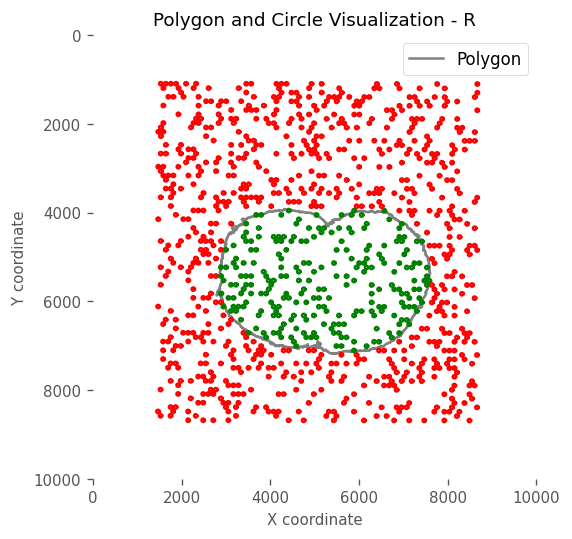

In [40]:
# contours_upright, _ = cv2.findContours(mask_label_binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
# polygons_upright = [cv2.approxPolyDP(contour, epsilon=1, closed=True) for contour in contours_upright]
# scaled_polygons_upright = [polygon / boundary_scale_factor for polygon in polygons_upright]

# # Assuming scaled_polygons and other necessary variables are already defined
# shapely_polygons_upright = [Polygon(poly.squeeze()) for poly in scaled_polygons_upright]

fig, ax = plt.subplots()

# for polygon in shapely_polygons_upright:
#     # Plot each polygon
#     x, y = polygon.exterior.xy
#     ax.plot(x, y, color='gray', label='Polygon')

x, y = adata.uns["spatial"]["geom"]["tissueBoundary"].exterior.xy
ax.plot(x, y, color='gray', label='Polygon')


# Plot each point as a circle, color based on intersection result
for barcode in list(adata.obs.index[:1000]):
    matching_row = adata.obs[adata.obs.index == barcode]

    pxl_row_in_fullres_value_upright = matching_row['pxl_row_in_fullres'].iloc[0]
    pxl_col_in_fullres_value_upright = matching_row['pxl_col_in_fullres'].iloc[0]

    pxl_row_in_fullres_value_transposed = pxl_col_in_fullres_value_upright
    pxl_col_in_fullres_value_transposed = pxl_row_in_fullres_value_upright

    point = Point(pxl_col_in_fullres_value_transposed, pxl_row_in_fullres_value_transposed)
    circle = point.buffer(0.5 * spot_scale_factor)  # Create the circle with a radius of half the spot diameter
    circle_x, circle_y = circle.exterior.xy
    color = 'green' if matching_row['intersects_boundary'].iloc[0] else 'red'
    # color = 'green' if barcode == 'AAACCGGGTAGGTACC-1' else 'red'
    ax.plot(circle_x, circle_y, color=color)

# Set aspect of the plot to be equal and invert y-axis
ax.set_aspect('equal')
ax.invert_yaxis()

# Enhancements for better visualization
ax.legend()  # Add a legend to identify the polygon and circle
plt.title('Polygon and Circle Visualization - R')
plt.xlabel('X coordinate')
plt.ylabel('Y coordinate')
ax.set_xlim([0, 10000])
ax.set_ylim([10000, 0])

# Show the plot
plt.show()


In [41]:
adata.obs.rename(columns={
    'pxl_row_in_fullres': 'pxl_row_in_fullres_upright',
    'pxl_col_in_fullres': 'pxl_col_in_fullres_upright',
    'pxl_col_in_fullres_transposed': 'pxl_col_in_fullres',
    'pxl_row_in_fullres_transposed': 'pxl_row_in_fullres'
}, inplace=True)

visium_spots = vp.spatial.get_visium_spots(adata, with_radius=True)

_ = vp.spatial.set_geometry(adata, geom="spot_poly", values=visium_spots)

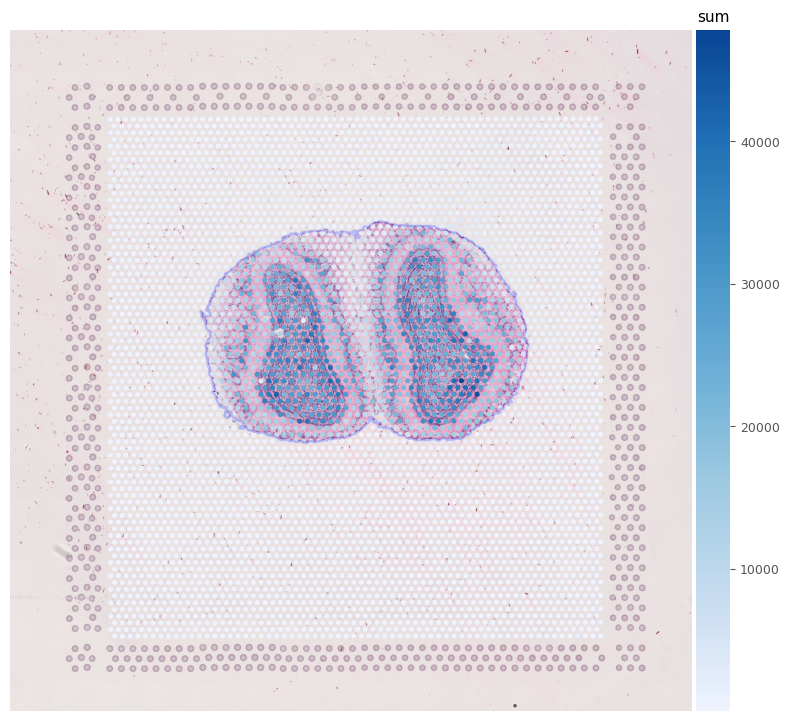

In [42]:
axs = vp.plt.plot_spatial_feature(
    adata,
    "sum",
    annot_geom = 'tissueBoundary_hires_exterior',
    image_kwargs=dict(),
    subplot_kwargs=dict(figsize=(8,8), dpi=100, layout='tight')
)

Discrepancies between Space Ranger’s annotation and the annotation based on tissue segmentation here:

In [43]:
def evaluate_conditions(row):
    if bool(row['in_tissue']) and not bool(row['intersects_boundary']):
        return "Space Ranger"
    elif bool(row['intersects_boundary']) and not bool(row['in_tissue']):
        return "Segmentation"
    else:
        return "Same"
    
adata.obs['diff_sr'] = adata.obs.apply(evaluate_conditions, axis=1)

adata.obs['diff_sr'] = adata.obs['diff_sr'].astype('category')

In [44]:
colors_dict = {'Space Ranger': 'orange', 'Segmentation': 'purple', 'Same': 'gray'}
sorted_color_dict = {key: colors_dict[key] for key in sorted(colors_dict.keys())}
colors_list = list(sorted_color_dict.values())
my_cat_cmap = ListedColormap(colors_list)

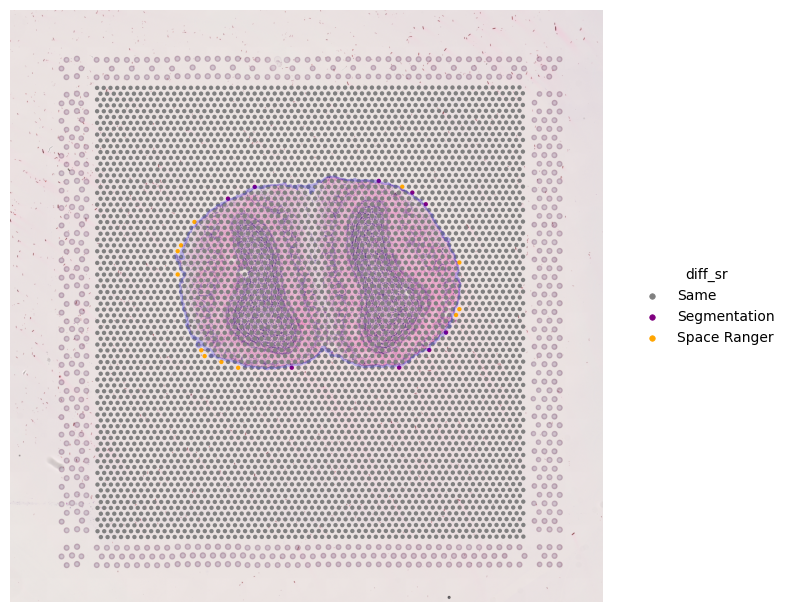

In [45]:
axs = vp.plt.plot_spatial_feature(
    adata,
    "diff_sr",
    annot_geom = 'tissueBoundary_hires_exterior',
    image_kwargs=dict(),
    cat_cmap=my_cat_cmap,
    subplot_kwargs=dict(figsize=(8,8), dpi=100, layout='tight')
)

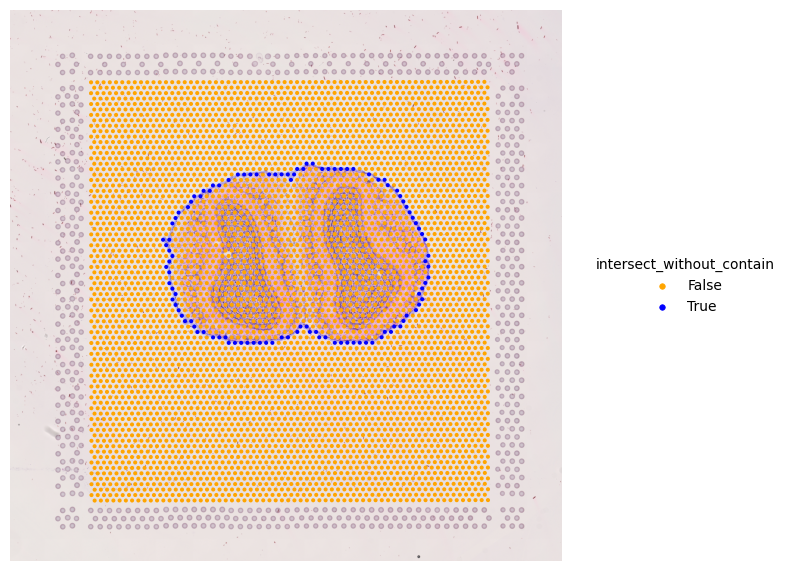

In [46]:
def intersect_without_contain(row):
    if bool(row['intersects_boundary']) and not bool(row['contained_in_boundary']):
        return True
    else:
        return False
    
adata.obs['intersect_without_contain'] = adata.obs.apply(intersect_without_contain, axis=1)

adata.obs['intersect_without_contain'] = adata.obs['intersect_without_contain'].astype('category')

colors_dict = {'True': 'blue', 'False': 'orange'}
sorted_color_dict = {key: colors_dict[key] for key in sorted(colors_dict.keys())}
colors_list = list(sorted_color_dict.values())
my_cat_cmap = ListedColormap(colors_list)

axs = vp.plt.plot_spatial_feature(
    adata,
    "intersect_without_contain",
    annot_geom = 'tissueBoundary_hires_exterior',
    image_kwargs=dict(),
    cat_cmap=my_cat_cmap,
    subplot_kwargs=dict(figsize=(8,8), dpi=100, layout='tight')
)

We can also get the geometries of the intersections between the tissue and the Visium spots, and then calculate what percentage of each spot is in tissue. However, this percentage may not be very useful if the tissue segmentation is subject to error. This percentage may be more useful for pathologist annotated histological regions or objects such as nuclei and myofibers.

In [47]:
def check_fraction_visium_spot_in_tissue(row):
    # Create a circle at the given coordinates with the specified radius
    circle = Point(row['pxl_col_in_fullres'], row['pxl_row_in_fullres']).buffer(0.5*spot_scale_factor)

    # Check if the circle intersects any polygon
    intersection = circle.intersection(adata.uns["spatial"]["geom"]["tissueBoundary"])

    fraction_in_tissue = intersection.area / circle.area

    return fraction_in_tissue

adata.obs['fraction_in_tissue'] = adata.obs.apply(check_fraction_visium_spot_in_tissue, axis=1)

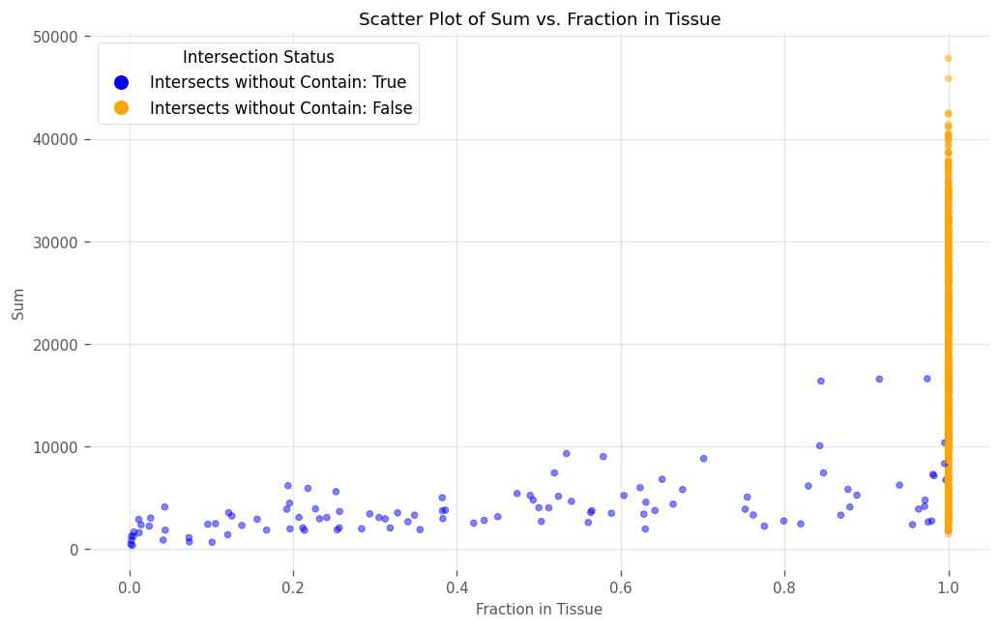

In [48]:
# Create the scatter plot
adata_tissue_only_list = adata.obs[adata.obs['fraction_in_tissue'] > 0]
color_values = adata_tissue_only_list['intersect_without_contain'].astype(str).map({'True': 'blue', 'False': 'orange'})

plt.figure(figsize=(10, 6))
plt.scatter(adata_tissue_only_list['fraction_in_tissue'], adata_tissue_only_list['sum'], c=color_values, alpha=0.5)  # alpha for transparency

# Adding labels and title
plt.xlabel('Fraction in Tissue')
plt.ylabel('Sum')
plt.title('Scatter Plot of Sum vs. Fraction in Tissue')

# Show grid
plt.grid(True)

from matplotlib.lines import Line2D
legend_elements = [
    Line2D([0], [0], marker='o', color='w', markerfacecolor='blue', markersize=10, label='Intersects without Contain: True'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='orange', markersize=10, label='Intersects without Contain: False')
]
plt.legend(handles=legend_elements, title="Intersection Status")

# Display the plot
plt.show()

In [49]:
adata.obsp

PairwiseArrays with keys: 

In [50]:
mask = adata.obs['fraction_in_tissue'] > 0

# Subset the AnnData object using the mask
adata_tissue_only = adata[mask].copy()

Fri Apr 26 08:59:56 2024 WARNING No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


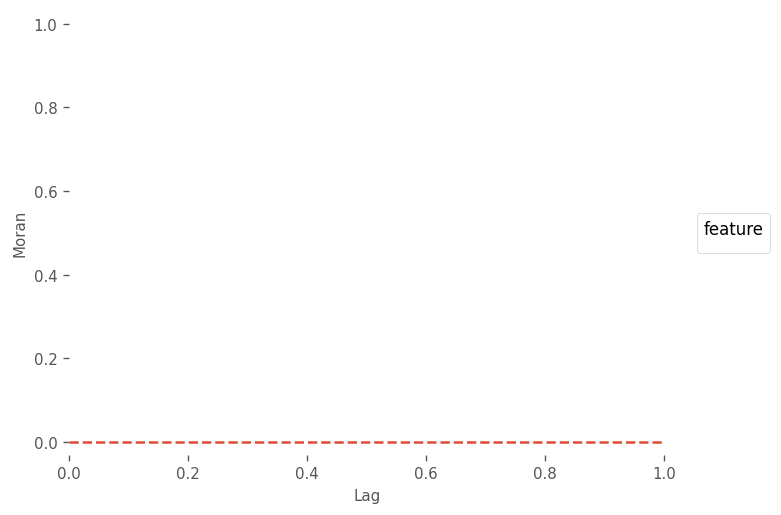

In [51]:
import networkx as nx
nn_graph = 'visium_graph'
nn_graph_object = vp.spatial.find_visium_graph(
    adata,
    subset=None,
    geom=None,
    graph_key=None,
    inplace=False,  # This is important as we don't want to modify the original graph
)

sparse_matrix = nx.to_scipy_sparse_array(nn_graph_object, nodelist=sorted(nn_graph_object.nodes()))

adata.obsp[nn_graph] = sparse_matrix

vp.spatial.set_default_graph(adata, nn_graph)
vp.spatial.to_spatial_weights(adata, graph_name=nn_graph)


vp.spatial.moran(adata, feature = qc_features, graph_name = nn_graph, permutations = 200)
vp.spatial.compute_higher_order_neighbors(adata, order=6)
vp.spatial.compute_correlogram(adata, qc_features, order=6)
_ = vp.plt.plot_correlogram(adata, features=qc_features, show_symbol=False)

In [52]:
import networkx as nx
nn_graph = 'visium_graph'
nn_graph_object = vp.spatial.find_visium_graph(
    adata_tissue_only,
    subset=None,
    geom=None,
    graph_key=None,
    inplace=False,  # This is important as we don't want to modify the original graph
)

sparse_matrix = nx.to_scipy_sparse_array(nn_graph_object, nodelist=sorted(nn_graph_object.nodes()))

adata_tissue_only.obsp[nn_graph] = sparse_matrix

AnnData object with n_obs × n_vars = 1182 × 32285
    obs: 'in_tissue', 'array_row', 'array_col', 'pxl_row_in_fullres_upright', 'pxl_col_in_fullres_upright', 'sum', 'detected', 'subsets_mito_sum', 'subsets_mito_detected', 'subsets_mito_percent', 'pxl_col_in_fullres', 'pxl_row_in_fullres', 'intersects_boundary', 'contained_in_boundary', 'diff_sr', 'intersect_without_contain', 'fraction_in_tissue'
    var: 'symbol', 'feature_types'
    uns: 'config', 'spatial', 'metadata'
    obsm: 'geometry'
    obsp: 'visium_graph'

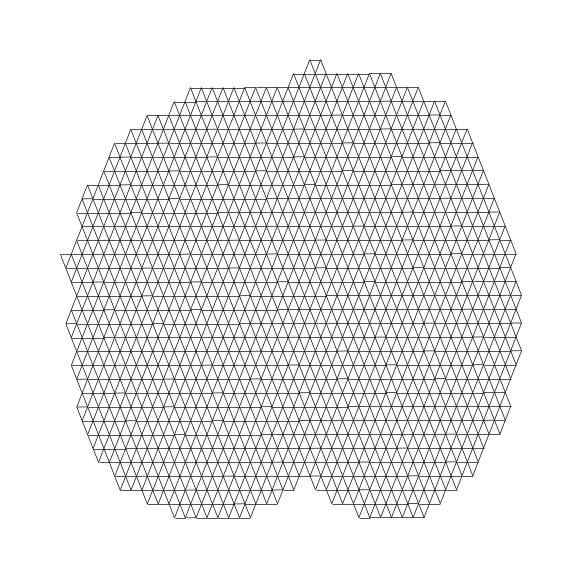

In [53]:
visium_graph = vp.plotting.draw_graph(adata_tissue_only, nn_graph)
vp.spatial.set_default_graph(adata_tissue_only, nn_graph)
vp.spatial.to_spatial_weights(adata_tissue_only, graph_name=nn_graph)

In [54]:
vp.spatial.moran(adata_tissue_only, feature = qc_features, graph_name = nn_graph, permutations = 200)
adata.uns['spatial']['moran'][nn_graph].loc[qc_features, ["I"]]

,I
sum,0.728619
detected,0.736931
subsets_mito_percent,0.640181


In [55]:
adata_tissue_only.uns['spatial']['moran'][nn_graph]
# adata_tissue_only.uns['spatial']['moran_mc'][nn_graph]['sum']

,I,EI
sum,0.728619,-0.000847
detected,0.736931,-0.000847
subsets_mito_percent,0.640181,-0.000847


In [56]:
adata_tissue_only.uns['spatial']['moran_mc'][nn_graph]

{'sum':           sim     p_sim
 0   -0.002285  0.004975
 1   -0.011515  0.004975
 2    0.035269  0.004975
 3   -0.025682  0.004975
 4    0.021421  0.004975
 ..        ...       ...
 195 -0.008386  0.004975
 196  0.029711  0.004975
 197 -0.025075  0.004975
 198  0.026405  0.004975
 199 -0.014582  0.004975
 
 [200 rows x 2 columns],
 'detected':           sim     p_sim
 0    0.018914  0.004975
 1    0.019401  0.004975
 2   -0.003520  0.004975
 3    0.020916  0.004975
 4    0.002323  0.004975
 ..        ...       ...
 195  0.008822  0.004975
 196  0.002387  0.004975
 197 -0.010130  0.004975
 198 -0.004470  0.004975
 199  0.008640  0.004975
 
 [200 rows x 2 columns],
 'subsets_mito_percent':           sim     p_sim
 0   -0.012396  0.004975
 1    0.000177  0.004975
 2    0.021423  0.004975
 3   -0.023466  0.004975
 4    0.005086  0.004975
 ..        ...       ...
 195 -0.037994  0.004975
 196 -0.025270  0.004975
 197 -0.003061  0.004975
 198  0.047445  0.004975
 199 -0.004921  0.004975
 
 

<AxesSubplot: >

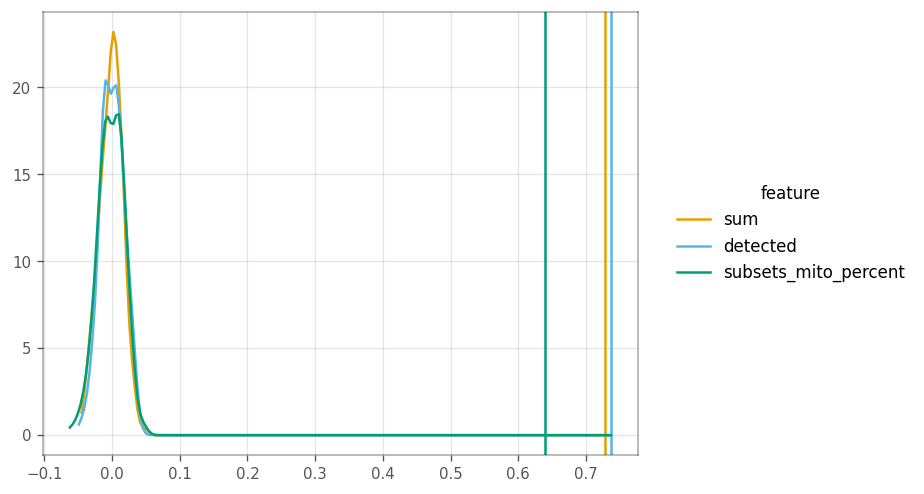

In [57]:
import importlib
importlib.reload(vp.plotting.plot)
importlib.reload(vp.plotting)

vp.plotting.plot_moran_mc(adata_tissue_only, qc_features, nn_graph)

In [58]:
# %load_ext watermark
# %watermark -v -m --iversions
# # %watermark -v -m --iversions -p package1,package2,etc

In [59]:
vp.spatial.compute_higher_order_neighbors(adata_tissue_only, order=6)
vp.spatial.compute_correlogram(adata_tissue_only, qc_features, order=6)

,1,2,3,4,5,6
sum,0.723744,0.579358,0.475261,0.378051,0.282435,0.196302
detected,0.729113,0.585958,0.481086,0.386634,0.296868,0.211707
subsets_mito_percent,0.641761,0.418675,0.274361,0.155674,0.070412,0.011243


In [72]:
print("Features to plot:", qc_features)
print("Available features:", adata_tissue_only.var_names)
# Check if all features in qc_features are in the dataset
for feature in qc_features:
    if feature in adata_tissue_only.var_names:
        print(f"{feature} is present.")
    else:
        print(f"{feature} is missing.")


Features to plot: ['sum', 'detected', 'subsets_mito_percent']
Available features: Index(['ENSMUSG00000051951', 'ENSMUSG00000089699', 'ENSMUSG00000102331',
       'ENSMUSG00000102343', 'ENSMUSG00000025900', 'ENSMUSG00000025902',
       'ENSMUSG00000104238', 'ENSMUSG00000104328', 'ENSMUSG00000033845',
       'ENSMUSG00000025903',
       ...
       'ENSMUSG00000096550', 'ENSMUSG00000094172', 'ENSMUSG00000094887',
       'ENSMUSG00000091585', 'ENSMUSG00000095763', 'ENSMUSG00000095523',
       'ENSMUSG00000095475', 'ENSMUSG00000094855', 'ENSMUSG00000095019',
       'ENSMUSG00000095041'],
      dtype='object', length=32285)
sum is missing.
detected is missing.
subsets_mito_percent is missing.


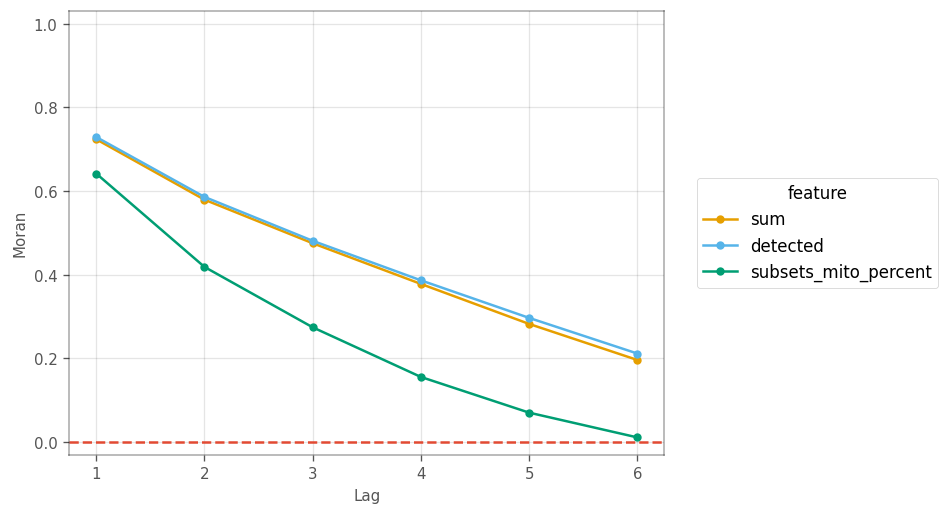

In [77]:
_ = vp.plt.plot_correlogram(adata_tissue_only, graph_name = 'visium_graph', features=qc_features, show_symbol=False)

In [68]:
print(adata_tissue_only.obs.head())
print(adata_tissue_only.var.head())
print(adata_tissue_only.X[:5, :5])  # Print the first 5x5 block of the matrix
if 'visium_graph' in adata_tissue_only.uns:
    print("Graph is present.")
else:
    print("Graph is missing.")


                    in_tissue  array_row  array_col  \
AAACCGGGTAGGTACC-1          1         42         28   
AAACCGTTCGTCCAGG-1          1         52         42   
AAACGAGACGGTTGAT-1          1         35         79   
AAACTGCTGGCTCCAA-1          1         45         67   
AAACTTGCAAACGTAT-1          1         45         19   

                    pxl_row_in_fullres_upright  pxl_col_in_fullres_upright  \
AAACCGGGTAGGTACC-1                        7078                        5238   
AAACCGTTCGTCCAGG-1                        6284                        6223   
AAACGAGACGGTTGAT-1                        4191                        4546   
AAACTGCTGGCTCCAA-1                        4869                        5532   
AAACTTGCAAACGTAT-1                        7587                        5535   

                        sum  detected  subsets_mito_sum  \
AAACCGGGTAGGTACC-1  31271.0      6471            6760.0   
AAACCGTTCGTCCAGG-1  31855.0      6674            3731.0   
AAACGAGACGGTTGAT-1  303

In [61]:
_ = vp.spatial.local_moran(adata_tissue_only, feature = qc_features)

In [62]:
# _ = vp.plt.plot_spatial_feature(
#     adata_tissue_only,
#     features = qc_features,
#     obsm='local_moran',
#     divergent=True
# )

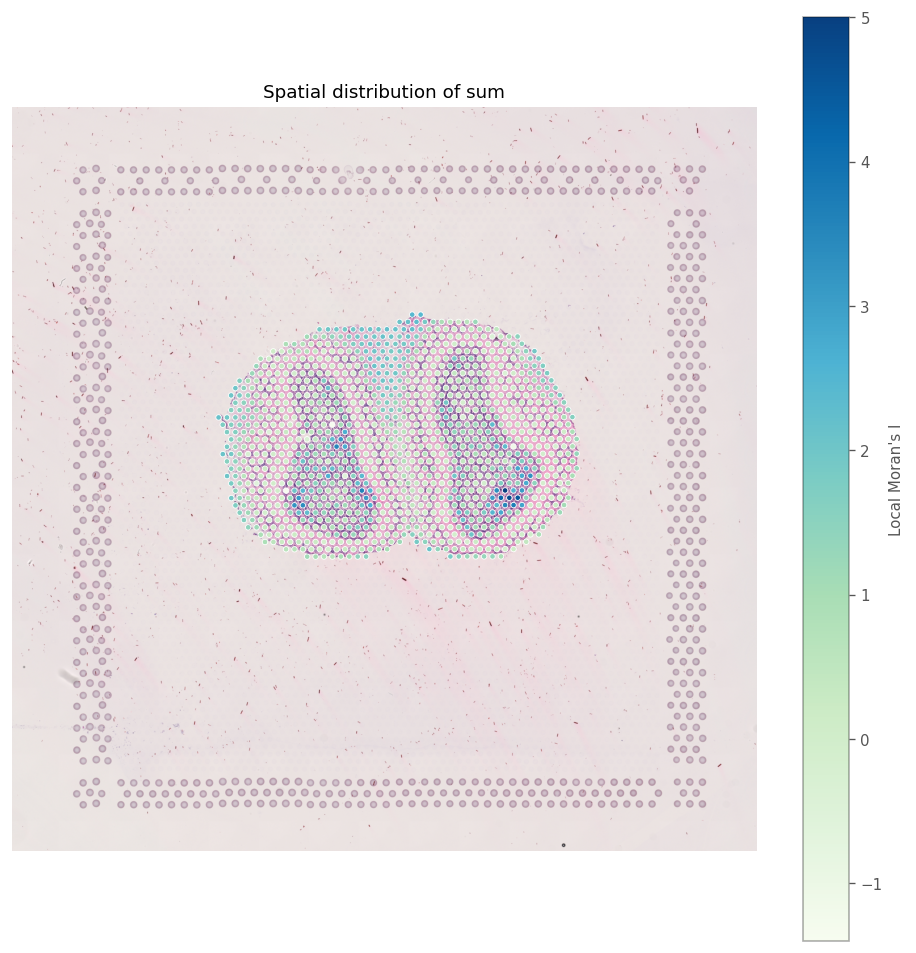

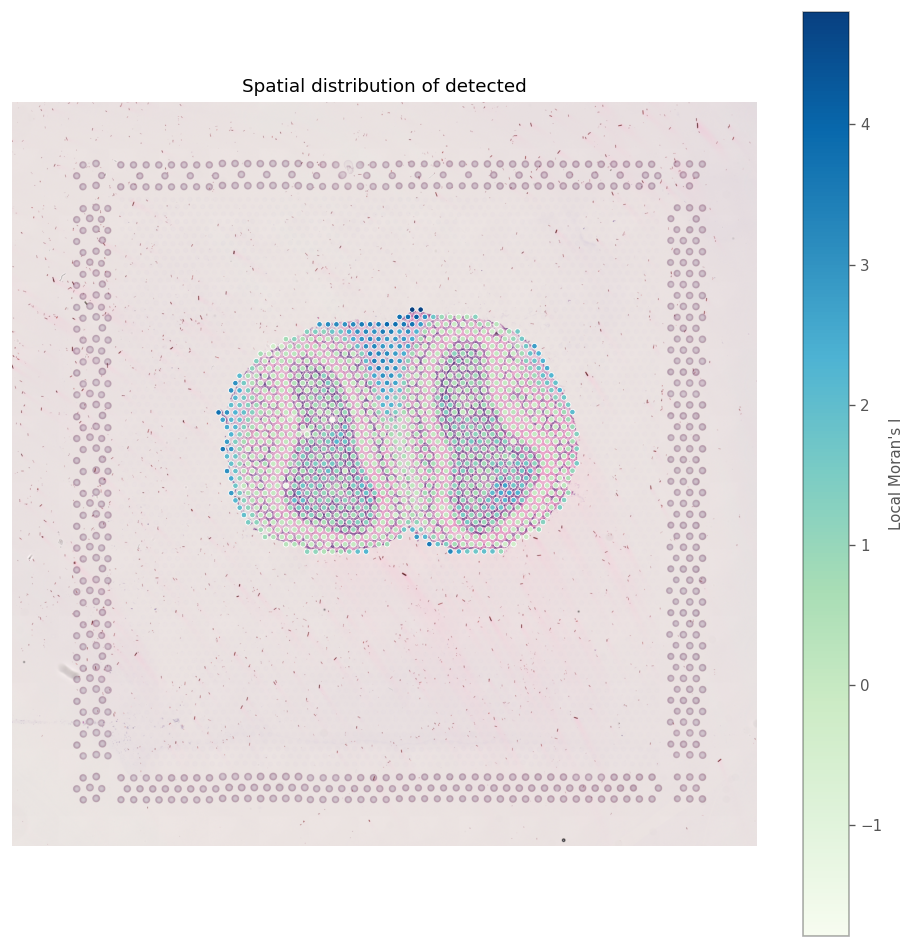

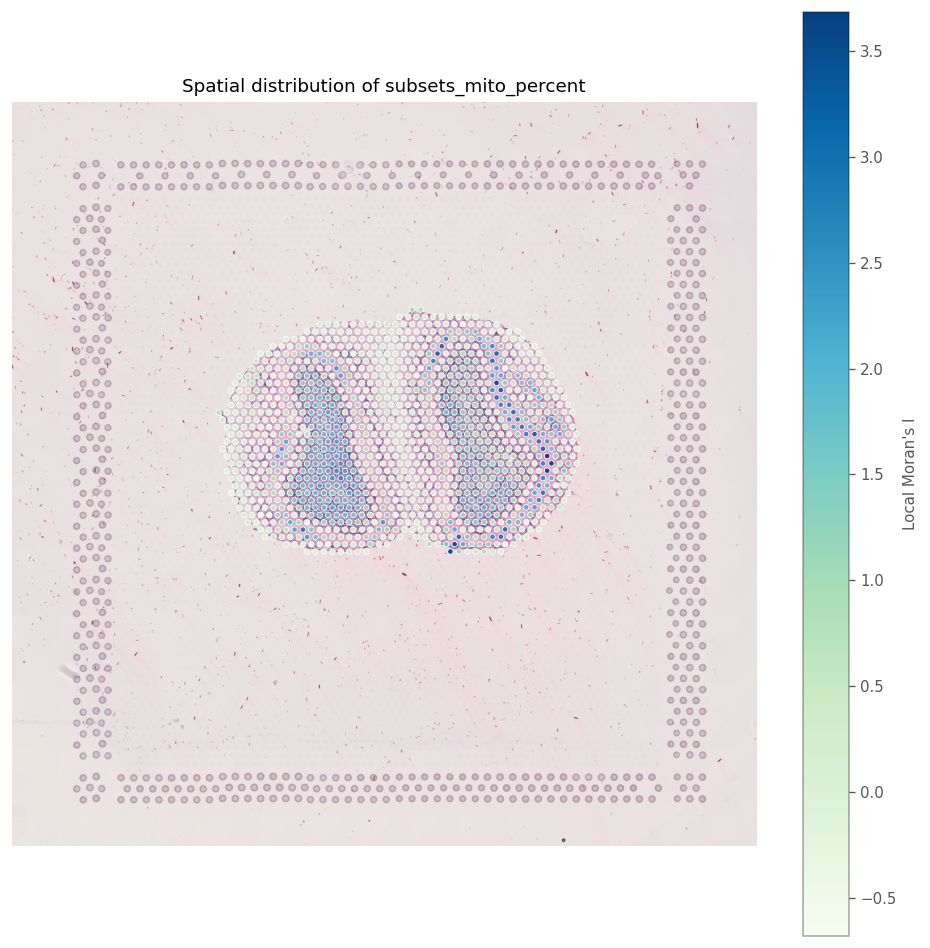

In [63]:
import matplotlib.patches as patches

visium_coords = vp.spatial.to_points(
    x="pxl_col_in_fullres",
    y="pxl_row_in_fullres",
    data=adata_tissue_only.obs,
    scale=hires_boundary_scale_factor,
    radius=None,
)

x_coords = visium_coords.geometry.x
y_coords = visium_coords.geometry.y
radius = hires_boundary_scale_factor * spot_scale_factor / 2

def plot_local_morans(adata, metric):
    image = adata.uns['spatial']['img']['hires']
    geometries = adata.obsm['geometry']  # Polygon data for each spot
    values = adata.obsm['local_moran'][metric]
    intersects_boundary = adata.obs['intersects_boundary']

    # Normalize values
    norm_values = (values - values.min()) / (values.max() - values.min())

    # Optional: Define a colormap
    cmap = plt.cm.GnBu

    fig, ax = plt.subplots(figsize=(10, 10))
    ax.imshow(image, aspect='equal')

    # Create a color map
    color_map = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=values.min(), vmax=values.max()))

    # Iterate through the geometries and plot them
    for index, value in zip(geometries['spot_poly'].index, norm_values):
        circle = patches.Circle((x_coords[index], y_coords[index]), radius, color=cmap(value), ec='white', linewidth=0.5)
        ax.add_patch(circle)

    # Add color bar
    cbar = fig.colorbar(color_map, ax=ax, orientation='vertical', label='Local Moran\'s I')

    ax.axis('off')
    ax.set_title(f'Spatial distribution of {metric}')
    
    plt.show()

for metric in qc_features:
    plot_local_morans(adata_tissue_only, metric)

In [64]:
adata.obs

,in_tissue,array_row,array_col,pxl_row_in_fullres_upright,pxl_col_in_fullres_upright,sum,detected,subsets_mito_sum,subsets_mito_detected,subsets_mito_percent,pxl_col_in_fullres,pxl_row_in_fullres,intersects_boundary,contained_in_boundary,diff_sr,intersect_without_contain,fraction_in_tissue
AAACAACGAATAGTTC-1,0,0,16,7762,1101,30.0,30,3.0,3,10.000000,7762.0,1101.0,False,False,Same,False,0.0
AAACAAGTATCTCCCA-1,1,50,102,2887,6022,1055.0,642,255.0,11,24.170616,2887.0,6022.0,False,False,Space Ranger,False,0.0
AAACAATCTACTAGCA-1,0,3,43,6232,1395,56.0,49,11.0,6,19.642857,6232.0,1395.0,False,False,Same,False,0.0
AAACACCAATAACTGC-1,0,59,19,7586,6914,624.0,470,89.0,9,14.262821,7586.0,6914.0,False,False,Same,False,0.0
AAACAGAGCGACTCCT-1,0,14,94,3343,2476,129.0,115,12.0,6,9.302326,3343.0,2476.0,False,False,Same,False,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTTTCACATCCAGG-1,1,58,42,6283,6814,11663.0,3892,3127.0,12,26.811284,6283.0,6814.0,True,True,Same,False,1.0
TTGTTTCATTAGTCTA-1,0,60,30,6963,7012,904.0,572,209.0,11,23.119469,6963.0,7012.0,False,False,Same,False,0.0
TTGTTTCCATACAACT-1,1,45,27,7134,5534,15211.0,4523,3559.0,12,23.397541,7134.0,5534.0,True,True,Same,False,1.0
TTGTTTGTATTACACG-1,0,73,41,6338,8292,251.0,197,40.0,9,15.936255,6338.0,8292.0,False,False,Same,False,0.0
